# Árboles de decisión: Churn compañía de servicios de telefonía móvil

Vamos a aplicar un modelo de clasificación de árboles de decisión a un dataset que describe los clientes de una compañía que presta servicios de telefonía móvil que se han abandonado o no la compañía para irse a la competencia.

Importamos las librerías que vamos a utilizar

In [103]:
import numpy as np #operaciones matriciales y con vectores
import pandas as pd #tratamiento de datos
import matplotlib.pyplot as plt #gráficos
from sklearn import tree, datasets, metrics
#from sklearn import neighbors, datasets, metrics
from sklearn.model_selection import train_test_split #metodo de particionamiento de datasets para evaluación
from sklearn.model_selection import cross_val_score, cross_validate #método para evaluar varios particionamientos de C-V
from sklearn.model_selection import KFold, StratifiedKFold, RepeatedKFold, LeaveOneOut #Iteradores de C-V
import seaborn as sns
import math

## Entendimiento de los datos

Cargamos los datos para entenderlos

In [104]:
data = pd.read_csv('02_churn.csv', sep=';', na_values=".")
print(data.shape)
data.head(5)

(20000, 12)


,COLLEGE,INCOME,OVERAGE,LEFTOVER,HOUSE,HANDSET_PRICE,OVER_15MINS_CALLS_PER_MONTH,AVERAGE_CALL_DURATION,REPORTED_SATISFACTION,REPORTED_USAGE_LEVEL,CONSIDERING_CHANGE_OF_PLAN,LEAVE
0,zero,31953,0,6,313378,161,0,4,unsat,little,no,STAY
1,one,36147,0,13,800586,244,0,6,unsat,little,considering,STAY
2,one,27273,230,0,305049,201,16,15,unsat,very_little,perhaps,STAY
3,zero,120070,38,33,788235,780,3,2,unsat,very_high,considering,LEAVE
4,one,29215,208,85,224784,241,21,1,very_unsat,little,never_thought,STAY


**Parte 1**:
* Determine el número de registros, de variables, sus tipos ideales/reales, y sus rangos
* Determine el baseline y su accuracy. ¿Están balanceados los datos?
* ¿Encuentran algún problema con los datos (missing values, datos inválidos (sentido común --> Potes), )?
* Si fuésemos a utilizar K-NN, ¿debería hacerse algún pretratamiento de los datos?

El método **describe** permite obtener un dataframe con una descripción de las variables de un dataframe analizado. Para cada variable encontramos el número de registros validos (*count*).

Además, si se trata de una variable categórica, se puede obtener el número de clases posibles (*unique*), la clase mayoritaria (*top*) y la frecuencia de la clase mayoritaria (*freq*).

Y, si se trata de una variable numérica, se puede obtener el promedio (*mean*), desviación estándar (*std*), los valores mínimos (*min*) y máximos (*max*) y los cuartiles (*25%*, *50%* y *75%*).

In [105]:
data.describe(include="all")

,COLLEGE,INCOME,OVERAGE,LEFTOVER,HOUSE,HANDSET_PRICE,OVER_15MINS_CALLS_PER_MONTH,AVERAGE_CALL_DURATION,REPORTED_SATISFACTION,REPORTED_USAGE_LEVEL,CONSIDERING_CHANGE_OF_PLAN,LEAVE
count,20000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000,20000,20000,20000
unique,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5,5,5,2
top,one,NaN,NaN,NaN,NaN,NaN,NaN,NaN,very_unsat,little,considering,STAY
freq,10048,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7909,7875,7920,10148
mean,NaN,80281.447750,85.979550,23.898650,493155.264250,389.615100,8.000700,6.002250,NaN,NaN,NaN,NaN
std,NaN,41680.586319,85.992324,26.816645,252407.884692,213.820682,8.925418,4.402558,NaN,NaN,NaN,NaN
min,NaN,20007.000000,-2.000000,0.000000,150002.000000,130.000000,0.000000,1.000000,NaN,NaN,NaN,NaN
25%,NaN,42217.000000,0.000000,0.000000,263714.250000,219.000000,1.000000,2.000000,NaN,NaN,NaN,NaN
50%,NaN,75366.500000,59.000000,14.000000,452259.500000,326.000000,4.000000,5.000000,NaN,NaN,NaN,NaN
75%,NaN,115881.750000,179.000000,41.000000,702378.000000,533.250000,15.000000,10.000000,NaN,NaN,NaN,NaN


In [106]:
data.LEAVE.describe()

count     20000
unique        2
top        STAY
freq      10148
Name: LEAVE, dtype: object

In [107]:
data.LEAVE.describe()['freq'] / data.LEAVE.describe()['count']

0.5074

Hay 12 atributos, incluyendo la variable objetivo LEAVE, que tiene cómo categoría mayoritaria STAY, que da un baseline de clasificación de 50,74%.

In [108]:
data.LEAVE.value_counts()

STAY     10148
LEAVE     9852
Name: LEAVE, dtype: int64

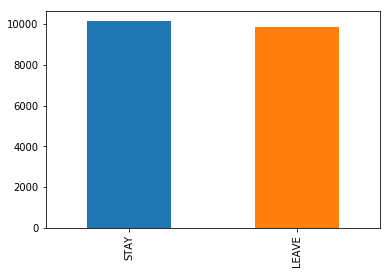

In [109]:
data.LEAVE.value_counts().plot.bar()

La variable objetivo está bastante balanceada

<font color='blue'>
    - Al parecer no hay problemas con datos faltantes (todas las variables tienen 20000 registros). <br/>
    - Las variables numéricas tienen escalas bastante diferentes, que resultarán en un problema al calcular distancias. <br/>
    - Los datos están bastante balanceados. <br/>
    - Hay un problema de incosistencia de datos con la variable OVERAGE, ya que su mínimo valor es de -2
</font>

**Parte 2**:

Utilizando pandas y matplotlib, analice la distribución de las variables independientes con respecto a los valores de la variable objetivo LEAVE y STAY. Trate de encontrar patrones en plots univariados (densidad) y Bivariados (scatterplots) para las variables numéricas, y gráficos de barras de conteo para las categóricas.

In [110]:
var_indep_cat = ['COLLEGE', 'REPORTED_SATISFACTION', 'REPORTED_USAGE_LEVEL',
       'CONSIDERING_CHANGE_OF_PLAN', 'LEAVE']

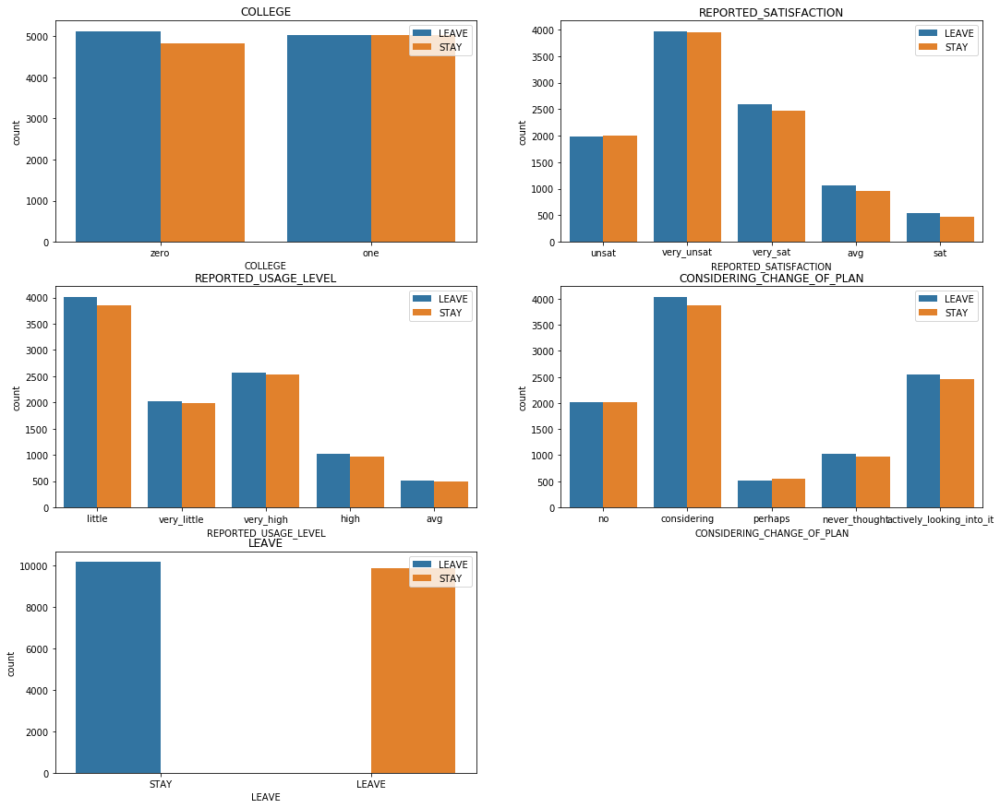

In [111]:
fig = plt.figure(figsize=(18,15))
i=1
for var_cat in var_indep_cat:
    ax = fig.add_subplot(math.ceil(len(var_indep_cat)/2), 2, i)
    sns.countplot(x=var_cat, hue="LEAVE", data=data)
    plt.title(var_cat)
    plt.legend(['LEAVE', 'STAY'])
    i+=1
    

In [112]:
var_indep_cat.remove('LEAVE')

In [113]:
var_indep_num = ['INCOME', 'OVERAGE', 'LEFTOVER', 'HOUSE', 'HANDSET_PRICE',
                 'OVER_15MINS_CALLS_PER_MONTH', 'AVERAGE_CALL_DURATION']

In [114]:
import warnings
warnings.filterwarnings('ignore')

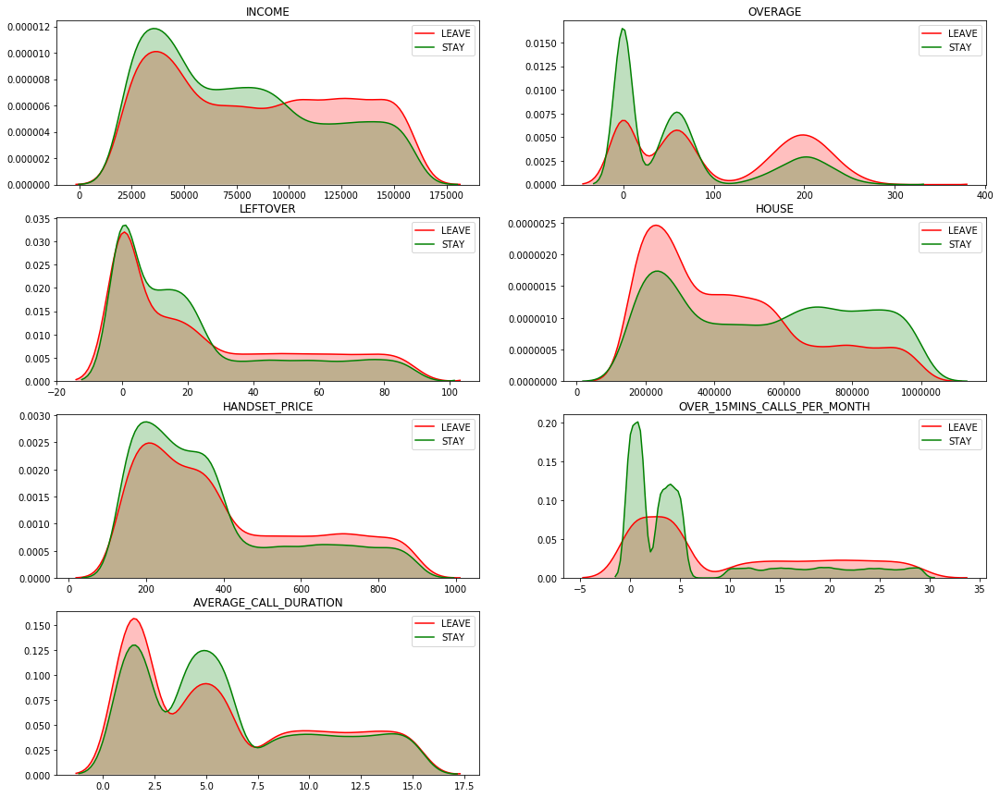

In [115]:
fig = plt.figure(figsize=(18,15))
i=1
for var_num in var_indep_num:
    ax = fig.add_subplot(math.ceil(len(var_indep_num)/2), 2, i)
    sns.kdeplot(data[data['LEAVE']=='LEAVE'][var_num], shade=True, color='r', ax=ax);
    sns.kdeplot(data[data['LEAVE']=='STAY'][var_num], shade=True, color='g', ax=ax);
    plt.title(var_num)
    plt.legend(['LEAVE', 'STAY'])
    i+=1

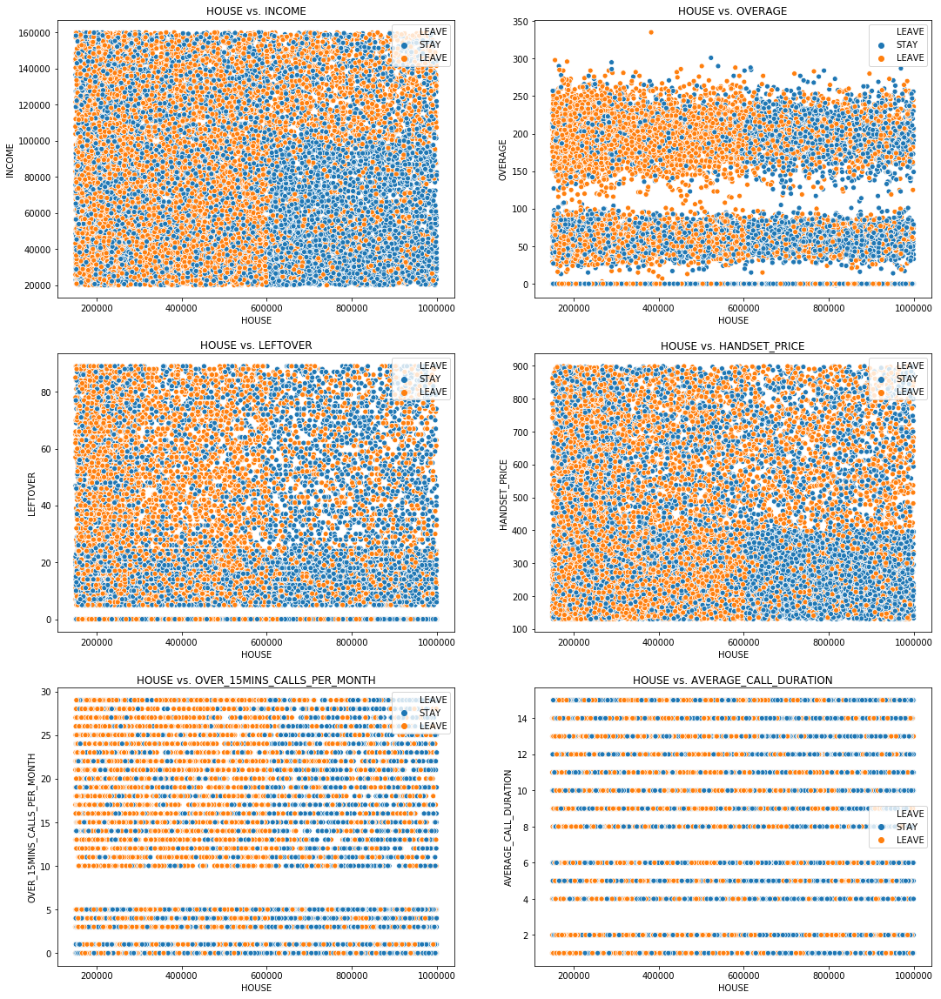

In [116]:
fig = plt.figure(figsize=(18,20))
ax = fig.add_subplot(3, 2, 1)
sns.scatterplot(x="HOUSE", y="INCOME", hue="LEAVE", data=data, ax=ax)
plt.title("HOUSE vs. INCOME")
ax = fig.add_subplot(3, 2, 2)
sns.scatterplot(x="HOUSE", y="OVERAGE", hue="LEAVE", data=data, ax=ax)
plt.title("HOUSE vs. OVERAGE")
ax = fig.add_subplot(3, 2, 3)
sns.scatterplot(x="HOUSE", y="LEFTOVER", hue="LEAVE", data=data, ax=ax)
plt.title("HOUSE vs. LEFTOVER")
ax = fig.add_subplot(3, 2, 4)
sns.scatterplot(x="HOUSE", y="HANDSET_PRICE", hue="LEAVE", data=data, ax=ax)
plt.title("HOUSE vs. HANDSET_PRICE")
ax = fig.add_subplot(3, 2, 5)
sns.scatterplot(x="HOUSE", y="OVER_15MINS_CALLS_PER_MONTH", hue="LEAVE", data=data, ax=ax)
plt.title("HOUSE vs. OVER_15MINS_CALLS_PER_MONTH")
ax = fig.add_subplot(3, 2, 6)
sns.scatterplot(x="HOUSE", y="AVERAGE_CALL_DURATION", hue="LEAVE", data=data, ax=ax)
plt.title("HOUSE vs. AVERAGE_CALL_DURATION")
plt.show()

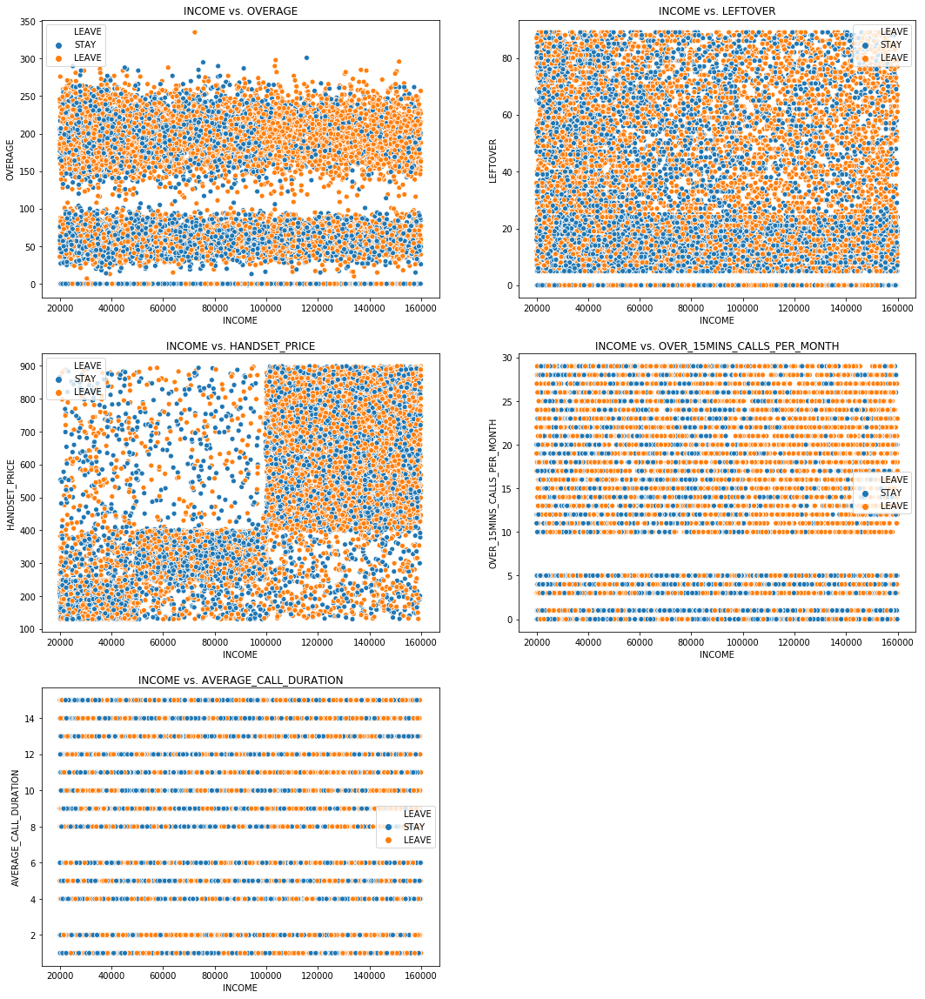

In [117]:
fig = plt.figure(figsize=(18,20))
ax = fig.add_subplot(3, 2, 1)
sns.scatterplot(x="INCOME", y="OVERAGE", hue="LEAVE", data=data, ax=ax)
plt.title("INCOME vs. OVERAGE")
ax = fig.add_subplot(3, 2, 2)
sns.scatterplot(x="INCOME", y="LEFTOVER", hue="LEAVE", data=data, ax=ax)
plt.title("INCOME vs. LEFTOVER")
ax = fig.add_subplot(3, 2, 3)
sns.scatterplot(x="INCOME", y="HANDSET_PRICE", hue="LEAVE", data=data, ax=ax)
plt.title("INCOME vs. HANDSET_PRICE")
ax = fig.add_subplot(3, 2, 4)
sns.scatterplot(x="INCOME", y="OVER_15MINS_CALLS_PER_MONTH", hue="LEAVE", data=data, ax=ax)
plt.title("INCOME vs. OVER_15MINS_CALLS_PER_MONTH")
ax = fig.add_subplot(3, 2, 5)
sns.scatterplot(x="INCOME", y="AVERAGE_CALL_DURATION", hue="LEAVE", data=data, ax=ax)
plt.title("INCOME vs. AVERAGE_CALL_DURATION")
plt.show()

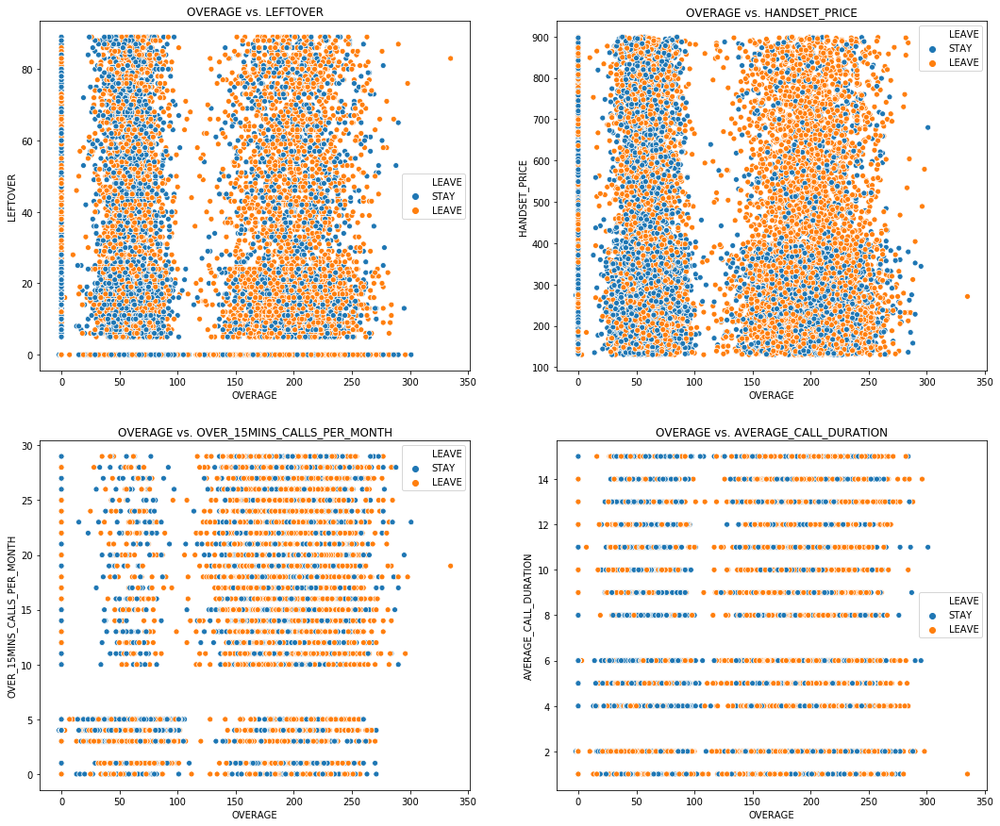

In [118]:
fig = plt.figure(figsize=(18,15))
ax = fig.add_subplot(2, 2, 1)
sns.scatterplot(x="OVERAGE", y="LEFTOVER", hue="LEAVE", data=data, ax=ax)
plt.title("OVERAGE vs. LEFTOVER")
ax = fig.add_subplot(2, 2, 2)
sns.scatterplot(x="OVERAGE", y="HANDSET_PRICE", hue="LEAVE", data=data, ax=ax)
plt.title("OVERAGE vs. HANDSET_PRICE")
ax = fig.add_subplot(2, 2, 3)
sns.scatterplot(x="OVERAGE", y="OVER_15MINS_CALLS_PER_MONTH", hue="LEAVE", data=data, ax=ax)
plt.title("OVERAGE vs. OVER_15MINS_CALLS_PER_MONTH")
ax = fig.add_subplot(2, 2, 4)
sns.scatterplot(x="OVERAGE", y="AVERAGE_CALL_DURATION", hue="LEAVE", data=data, ax=ax)
plt.title("OVERAGE vs. AVERAGE_CALL_DURATION")
plt.show()

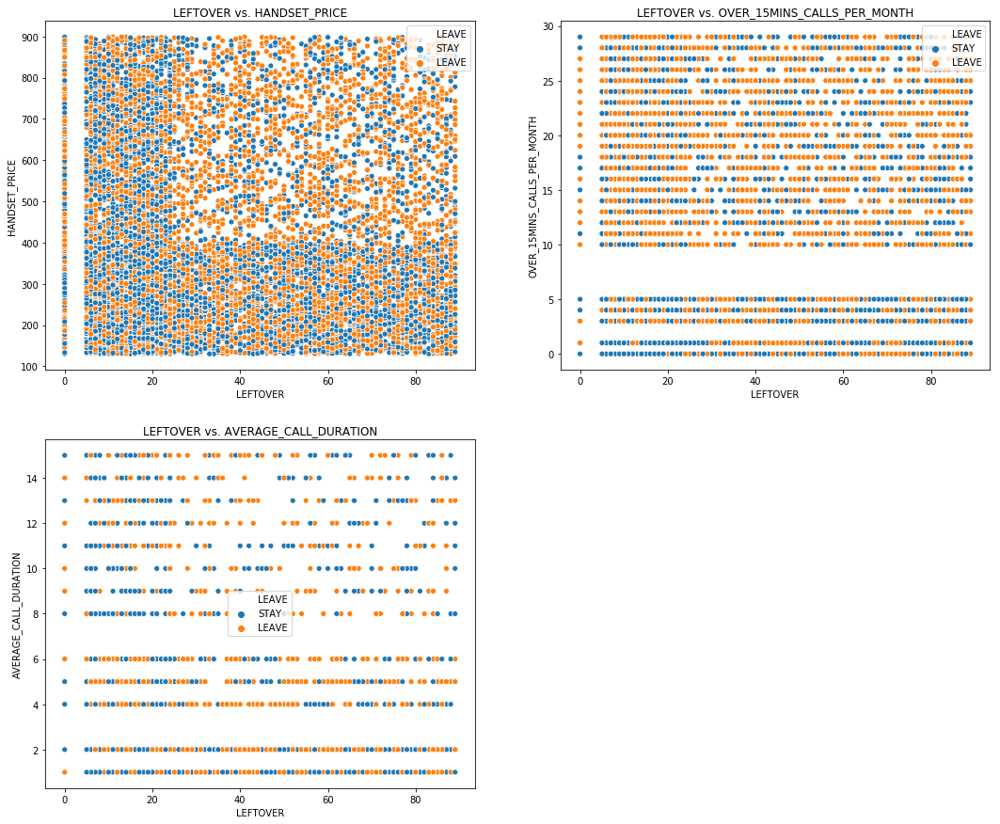

In [119]:
fig = plt.figure(figsize=(18,15))
ax = fig.add_subplot(2, 2, 1)
sns.scatterplot(x="LEFTOVER", y="HANDSET_PRICE", hue="LEAVE", data=data, ax=ax)
plt.title("LEFTOVER vs. HANDSET_PRICE")
ax = fig.add_subplot(2, 2, 2)
sns.scatterplot(x="LEFTOVER", y="OVER_15MINS_CALLS_PER_MONTH", hue="LEAVE", data=data, ax=ax)
plt.title("LEFTOVER vs. OVER_15MINS_CALLS_PER_MONTH")
ax = fig.add_subplot(2, 2, 3)
sns.scatterplot(x="LEFTOVER", y="AVERAGE_CALL_DURATION", hue="LEAVE", data=data, ax=ax)
plt.title("LEFTOVER vs. AVERAGE_CALL_DURATION")
plt.show()

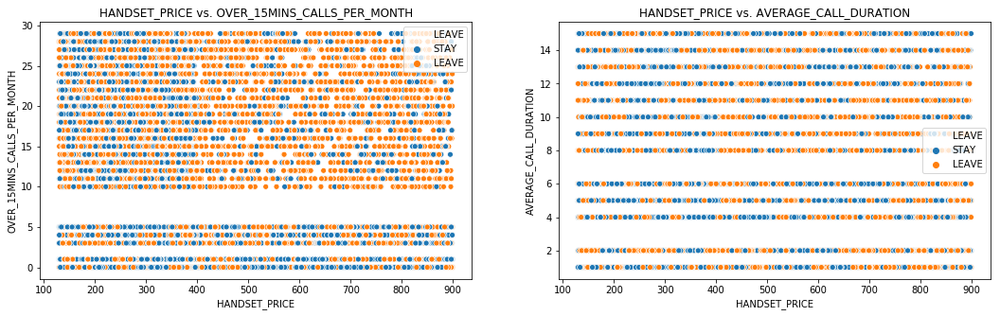

In [120]:
fig = plt.figure(figsize=(18,5))
ax = fig.add_subplot(1, 2, 1)
sns.scatterplot(x="HANDSET_PRICE", y="OVER_15MINS_CALLS_PER_MONTH", hue="LEAVE", data=data, ax=ax)
plt.title("HANDSET_PRICE vs. OVER_15MINS_CALLS_PER_MONTH")
ax = fig.add_subplot(1, 2, 2)
sns.scatterplot(x="HANDSET_PRICE", y="AVERAGE_CALL_DURATION", hue="LEAVE", data=data, ax=ax)
plt.title("HANDSET_PRICE vs. AVERAGE_CALL_DURATION")
plt.show()

Algunos de los plots no son fáciles de interpretar porque los puntos están uno encima de otro.
Para estos casos se puede agregar un poco de ruido (**jitter**) a los puntos. 
Vamos a agregarlo a mano para el siguiente plot (increiblemente Python no tiene esta funcionalidad!!!).
Veamos como sería sin el jitter.

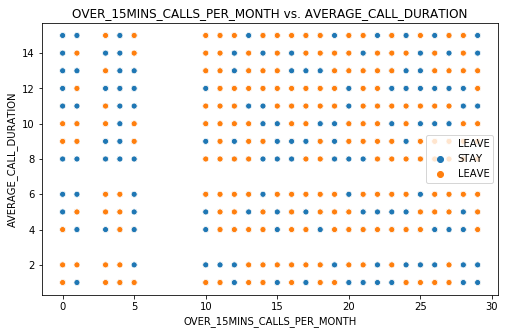

In [121]:
fig = plt.figure(figsize=(18,5))
ax = fig.add_subplot(1, 2, 1)
sns.scatterplot(x="OVER_15MINS_CALLS_PER_MONTH", y="AVERAGE_CALL_DURATION", hue="LEAVE", data=data, ax=ax)
plt.title("OVER_15MINS_CALLS_PER_MONTH vs. AVERAGE_CALL_DURATION")
plt.show()

Ahora veamos con el jitter (creado a mano), combinado con una reducción en el tamaño de los puntos para que se vea una mayor cantidad de puntos.

In [122]:
d2 = data[["OVER_15MINS_CALLS_PER_MONTH", "AVERAGE_CALL_DURATION", "LEAVE"]]
jitter = 0.3
d2.OVER_15MINS_CALLS_PER_MONTH = data.OVER_15MINS_CALLS_PER_MONTH + np.random.normal(scale=jitter, size=20000)
d2.AVERAGE_CALL_DURATION = data.AVERAGE_CALL_DURATION + np.random.normal(scale=jitter, size=20000)

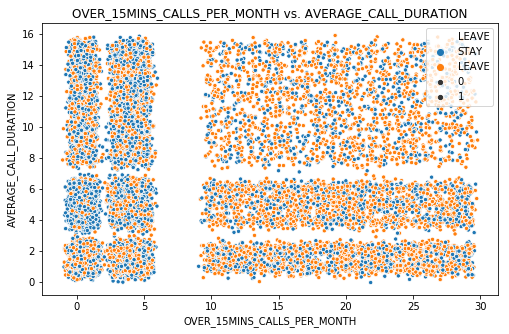

In [123]:
fig = plt.figure(figsize=(18,5))
ax = fig.add_subplot(1, 2, 1)
sns.scatterplot(x="OVER_15MINS_CALLS_PER_MONTH", y="AVERAGE_CALL_DURATION", hue="LEAVE", data=d2, ax=ax, size=1)
plt.title("OVER_15MINS_CALLS_PER_MONTH vs. AVERAGE_CALL_DURATION")
plt.show()

# Clasificación a partir un árbol de decisión

Los árboles de decisión permiten utilizar tanto las variables predictivas categóricas como las numéricas.
No todas las variables van a ser útiles. El árbol se va a encargar de encontrar la mejor variable a utilizar en el contexto del subconjunto de datos de cada rama.

Veamos cómo se crea un árbol de decisión en scikit-learn, y algunos de los parámetros más importantes:

In [124]:
np.random.seed(1234)
ctree = tree.DecisionTreeClassifier(
    criterion='entropy', # el criterio de particionamiento de un conjunto de datos (gini, entropy)
    max_depth=None,      # prepoda: controla la profundidad del árbol (largo máximo de las ramas)
    min_samples_split=2, # prepoda: el mínimo número de registros necesarios para crear una nueva rama
    min_samples_leaf=1,  # prepoda: el mínimo número de registros en una hoja
    random_state=None,   # semilla del generador aleatorio utilizado para 
    max_leaf_nodes=None, # prepoda: máximo número de nodos hojas
    min_impurity_decrease=0.0, # prepoda: umbral mínimo de reducción de la impureza para aceptar la creación de una rama
    class_weight=None    # permite asociar pesos a las clases, en el caso de diferencias de importancia entre ellas
)

**Nota editorial**: no puedo creer que scikit-learn soporte en sus árboles de decisión solamente variables independientes numéricas!!!!! Toca entonces utilizar un encoding (one hot).

In [125]:
data_cat_one_hot = pd.get_dummies(data[var_indep_cat], prefix=var_indep_cat)
X = data[var_indep_num].join(data_cat_one_hot)
y = data['LEAVE']
X.shape

(20000, 24)

Quedaron 24 variables independientes.

In [126]:
np.random.seed(1234)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3)

In [127]:
ctree.fit(X_train, y_train)

DecisionTreeClassifier(class_weight=None, criterion='entropy', max_depth=None,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best')

Una vez el árbol es aprendido, se puede consultar diferentes atributos.
El mas interesante, aparte del árbol en sí, es el que asocia un índice de importancia a los atributos independientes en la clasificación:

In [128]:
ctree.feature_importances_

array([0.17437343, 0.14944112, 0.09124796, 0.19132363, 0.13132086,
       0.05914209, 0.04566898, 0.00888597, 0.01150407, 0.00899971,
       0.00531261, 0.00895118, 0.01187495, 0.01149387, 0.00462386,
       0.00871771, 0.01189083, 0.00972819, 0.00831384, 0.01212178,
       0.01153006, 0.00635061, 0.01110528, 0.00607741])

In [129]:
X.columns

Index(['INCOME', 'OVERAGE', 'LEFTOVER', 'HOUSE', 'HANDSET_PRICE',
       'OVER_15MINS_CALLS_PER_MONTH', 'AVERAGE_CALL_DURATION', 'COLLEGE_one',
       'COLLEGE_zero', 'REPORTED_SATISFACTION_avg',
       'REPORTED_SATISFACTION_sat', 'REPORTED_SATISFACTION_unsat',
       'REPORTED_SATISFACTION_very_sat', 'REPORTED_SATISFACTION_very_unsat',
       'REPORTED_USAGE_LEVEL_avg', 'REPORTED_USAGE_LEVEL_high',
       'REPORTED_USAGE_LEVEL_little', 'REPORTED_USAGE_LEVEL_very_high',
       'REPORTED_USAGE_LEVEL_very_little',
       'CONSIDERING_CHANGE_OF_PLAN_actively_looking_into_it',
       'CONSIDERING_CHANGE_OF_PLAN_considering',
       'CONSIDERING_CHANGE_OF_PLAN_never_thought',
       'CONSIDERING_CHANGE_OF_PLAN_no', 'CONSIDERING_CHANGE_OF_PLAN_perhaps'],
      dtype='object')

Encontramos entonces que las variables en orden de importancia son:

In [130]:
X.columns[np.argsort(-ctree.feature_importances_)]

Index(['HOUSE', 'INCOME', 'OVERAGE', 'HANDSET_PRICE', 'LEFTOVER',
       'OVER_15MINS_CALLS_PER_MONTH', 'AVERAGE_CALL_DURATION',
       'CONSIDERING_CHANGE_OF_PLAN_actively_looking_into_it',
       'REPORTED_USAGE_LEVEL_little', 'REPORTED_SATISFACTION_very_sat',
       'CONSIDERING_CHANGE_OF_PLAN_considering', 'COLLEGE_zero',
       'REPORTED_SATISFACTION_very_unsat', 'CONSIDERING_CHANGE_OF_PLAN_no',
       'REPORTED_USAGE_LEVEL_very_high', 'REPORTED_SATISFACTION_avg',
       'REPORTED_SATISFACTION_unsat', 'COLLEGE_one',
       'REPORTED_USAGE_LEVEL_high', 'REPORTED_USAGE_LEVEL_very_little',
       'CONSIDERING_CHANGE_OF_PLAN_never_thought',
       'CONSIDERING_CHANGE_OF_PLAN_perhaps', 'REPORTED_SATISFACTION_sat',
       'REPORTED_USAGE_LEVEL_avg'],
      dtype='object')

Vamos ahora a visualizar el árbol aprendido (para hacerlo, se necesita preinstalar la aplicación graphviz).

In [131]:
import pydotplus
from IPython.display import Image  
from sklearn.externals.six import StringIO  

In [132]:
dot_data = StringIO()
tree.export_graphviz(ctree, 
                     filled=True, rounded=True,  #nodos redondeados y coloreados
                     class_names=ctree.classes_,
                     feature_names=X_train.columns,  
                     out_file=dot_data,
                     special_characters=True)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.279382 to fit



La imágen es demasiado grande para poder visualizarla aquí, vamos a guardarla un archivo y abrirla en un visor externo que permita hacer zoom.

In [133]:
Create PNG
graph.write_png("arbol.png")

SyntaxError: invalid syntax (<ipython-input-133-a14014677968>, line 1)

Como se puede ver el árbol es increiblemente grande y complejo, pues no se especificó ninguna manera de limitar su crecimiento.

## Evaluación del modelo

Ya tenemos el modelo "aprendido" con el dataset de 20000 instancias.
Vamos ahora a evaluarlo sobre ese mismo dataset para poder ver los éxitos y errores de la predicción. 

In [ ]:
y_pred = ctree.predict(X_test)

In [ ]:
cm= metrics.confusion_matrix(y_test, y_pred)
plt.imshow(cm, cmap=plt.cm.Blues)
plt.title("Matriz de confusión para K=5")
plt.colorbar()
tick_marks = np.arange(2)
plt.xticks(tick_marks, y_test.unique())
plt.yticks(tick_marks, y_test.unique())
plt.show()

In [ ]:
print(cm)
print("Exactitud: ", metrics.accuracy_score(y_test, y_pred))
print("Kappa    : ", metrics.cohen_kappa_score(y_test, y_pred))
print("Precisión     : ", metrics.precision_score(y_test, y_pred, "LEAVE", average='macro'))
print("Recall        : ", metrics.recall_score(y_test, y_pred, "LEAVE", average='macro'))
VN = np.sum(cm[1:3,1:3])
FP = np.sum(cm[0,1:3])
specificity = VN/(VN+FP)
print("Especificidad : ", specificity)
print("F1-score      : ", metrics.f1_score(y_test, y_pred, "LEAVE", average='macro'))


Con el árbol completo, obtuvimos un nivel de accuracy del 61.68%, cuando el baseline era de 50.74%.

## Overfitting: poda del árbol

Vamos a ver que hubiera pasado si limitamos el crecimiento del árbol (prepoda), controlando la profundidad del árbol y el mínimo número de registros de un nodo para permitir el particionamiento.

**Parte 3**:

* Modifiquen el parámetro **criterion** y los parámetros de pre-poda **max_depth** y **min_samples_split** buscando una mejor exactitud del modelo.
* Intenten con modelos KNN y Naive Bayes

PRIMERO

In [ ]:
np.random.seed(1234)
ctree = tree.DecisionTreeClassifier(
    criterion='entropy', # el criterio de particionamiento de un conjunto de datos (gini, entropy)
    max_depth=20,      # prepoda: controla la profundidad del árbol (largo máximo de las ramas)
    min_samples_split=2, # prepoda: el mínimo número de registros necesarios para crear una nueva rama
    min_samples_leaf=1,  # prepoda: el mínimo número de registros en una hoja
    random_state=None,   # semilla del generador aleatorio utilizado para 
    max_leaf_nodes=10, # prepoda: máximo número de nodos hojas
    min_impurity_decrease=0.0, # prepoda: umbral mínimo de reducción de la impureza para aceptar la creación de una rama
    class_weight=None    # permite asociar pesos a las clases, en el caso de diferencias de importancia entre ellas
)

In [ ]:
y_pred = ctree.predict(X_test)

In [ ]:
cm= metrics.confusion_matrix(y_test, y_pred)
plt.imshow(cm, cmap=plt.cm.Blues)
plt.title("Matriz de confusión para K=5")
plt.colorbar()
tick_marks = np.arange(2)
plt.xticks(tick_marks, y_test.unique())
plt.yticks(tick_marks, y_test.unique())
plt.show()

In [ ]:
print(cm)
print("Exactitud: ", metrics.accuracy_score(y_test, y_pred))
print("Kappa    : ", metrics.cohen_kappa_score(y_test, y_pred))
print("Precisión     : ", metrics.precision_score(y_test, y_pred, "LEAVE", average='macro'))
print("Recall        : ", metrics.recall_score(y_test, y_pred, "LEAVE", average='macro'))
VN = np.sum(cm[1:3,1:3])
FP = np.sum(cm[0,1:3])
specificity = VN/(VN+FP)
print("Especificidad : ", specificity)
print("F1-score      : ", metrics.f1_score(y_test, y_pred, "LEAVE", average='macro'))
ctree.fit(X_train, y_train)